In [64]:
# imports 

import gensim
import matplotlib.pyplot as plt
import nltk
import seaborn as sns
import pandas as pd
import numpy as np
import json
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
#from MulticoreTSNE import MulticoreTSNE as TSNE

from sklearn.decomposition import PCA
import  PIL
from PIL import Image

In [34]:
words = gensim.models.KeyedVectors.load_word2vec_format(
    '../model/GoogleNews-vectors-negative300.bin', binary=True)

In [35]:
fp = open('../scraper-node/https%3A%2F%2Fwww.unconditional.uk.com_1577563929820')

In [36]:
line = fp.readline()
while line:
    #print(line)
    line = fp.readline()

In [39]:
data = {}
vectors = {}
vector_images = {}
with open('../scraper-node/https%3A%2F%2Fwww.fashionnova.com_1577573648586') as f:
    for line in f:
        try:
            line = json.loads(line)
        except:
            print("Invalid line " + line)
            continue
        title = line['title']
        try:
            line_words = list(filter(lambda word: word in words.vocab, title.split(' ')))
            if len(line_words) < 1:
                   raise Exception('Invalid title')
            data[title] = line_words
            v = list(map(lambda word: words[word], data[title]))
            if len(v) < 1:
                raise Exception('Invalid title')
            vectors[title] = v
            vector_images[title] = line["image:image"]["image:loc"]
        except:
            print("Skipped " + title)

Skipped desiree
Skipped honeylove bralette
Skipped ep32127 grey
Skipped b402
Skipped deeana
Skipped dont say a word jeans dark blue stores only
Skipped rehab sunglasses multi fuchsia
Skipped karlie
Skipped sweet and sour set burgundy 1
Skipped sweet and sour set black 1
Skipped roberto boyfriend jeans 1
Skipped sweet and sour set black 2
Skipped sweet and sour set burgundy 2
Skipped twist and tie set olive 1
Skipped twist and tie set burgundy 1
Skipped seal it with a kiss set black 2
Skipped keep it a secret set olive 2
Skipped love me like you do matching set hunter green 2
Skipped sweet and sour set black 3
Skipped sweet and sour set burgundy 3
Skipped twist and tie set burgundy 2
Skipped twist and tie set olive 2
Skipped soni stripe lounge set olive multi
Skipped soni stripe lounge set black
Skipped p3072_burgundy
Skipped pgi1275_rust
Skipped hailey front twist cropped top black
Skipped hailey front twist cropped top red
Skipped hailey front twist cropped top off white
Skipped money

In [40]:
len(data.keys()) == len(vectors.keys())

True

In [41]:
means = [np.mean(vectors[key], axis=0).tolist() for key in vectors.keys()]

In [152]:
means

[[-0.0408528633415699,
  0.0512288399040699,
  -0.06561279296875,
  0.1392008513212204,
  0.0329793281853199,
  -0.1219889298081398,
  0.0026448566932231188,
  -0.1370442658662796,
  0.013997395522892475,
  0.2472330778837204,
  -0.09228515625,
  -0.06298828125,
  0.05029296875,
  0.1928812712430954,
  -0.1847330778837204,
  0.04718017578125,
  -0.0970052108168602,
  0.0986328125,
  -0.1018880233168602,
  -0.0997721329331398,
  0.0654296875,
  0.0517578125,
  -0.02347818948328495,
  -0.11248779296875,
  -0.02571614645421505,
  -0.0732421875,
  -0.0372721366584301,
  0.21875,
  0.0944010391831398,
  -0.1085611954331398,
  -0.0423177070915699,
  0.1365559846162796,
  -0.0370686836540699,
  -0.0052897133864462376,
  -0.066162109375,
  0.02827962301671505,
  0.1435546875,
  0.044708251953125,
  -0.2335612028837204,
  0.2464192658662796,
  -0.130859375,
  -0.02838134765625,
  -0.0399678535759449,
  -0.2411702424287796,
  0.10595703125,
  -0.0553792305290699,
  -0.0364583320915699,
  -0.2163

In [42]:
kmeans = KMeans(n_clusters=6).fit(means)

In [43]:
kmeans.predict(means)

array([5, 0, 5, ..., 0, 0, 2])

In [150]:
# Save model
import pickle
filename = 'kmeans_model.pkl'
pickle.dump(kmeans, open(filename, 'wb'))

In [ ]:
pca = PCA(n_components=150)
reduc = pca.fit_transform(means)
print(sum((pca.explained_variance_ratio_)))

In [ ]:
reduc

In [ ]:
X_embedded = TSNE(n_components=2).fit_transform(means)

In [ ]:
X_embedded[0:,1]

In [44]:
#df = pd.DataFrame(X_embedded, columns = ['ts1', 'ts2'])
df = pd.DataFrame(vectors.keys(), columns = ['words'])

In [45]:
df['cluster'] = kmeans.predict(means)

In [46]:
df['cluster'].value_counts()

0    41033
2    20187
4    20096
5    18663
3     7035
1     5163
Name: cluster, dtype: int64

In [ ]:
plt.figure(figsize=(11,9))
sns.scatterplot(df['ts1'], df['ts2'], hue=df['cluster'])


In [61]:
df.words[0]

'black ripped leggings'

In [59]:
df['words'] = vectors.keys()
df['images'] = df['words'].map(lambda x: vector_images[x])

KeyError: 'dont say a word jeans dark blue stores only'

In [62]:
vector_images['dont say a word jeans dark blue stores only']

KeyError: 'dont say a word jeans dark blue stores only'

In [51]:
len(vectors)

112177

In [70]:
import requests
from io import BytesIO

response = requests.get(vector_images['black ripped leggings'])
img = Image.open(BytesIO(response.content))

In [68]:
list(vector_images.keys())[0]

'black ripped leggings'

In [119]:
num_cols = 5

In [118]:
num_rows = 5

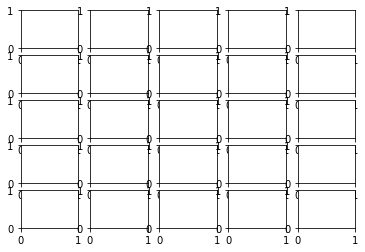

In [132]:
f, axarr = plt.subplots(num_cols, num_rows)

In [131]:
for num, text in enumerate(df_test['words'].iloc[50:(num_cols * num_rows) - 1,]):
    response = requests.get(vector_images[text])
    img = Image.open(BytesIO(response.content))
    #f = plt.figure()
    plt.figure( figsize=(12,4))
    x = num % num_cols
    y = num / num_rows
    axarr[y][x].imshow(img)


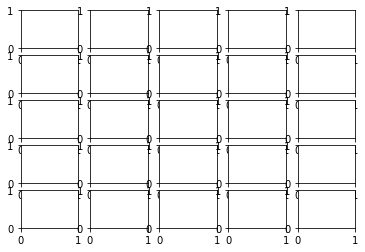

In [133]:
f

In [ ]:
_, axs = plt.subplots(n_row, n_col, figsize=(12, 12))
axs = axs.flatten()
for img, ax in zip(imgs, axs):
    ax.imshow(img)
    plt.show()

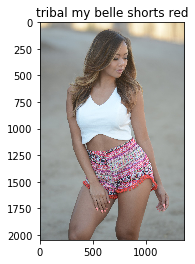

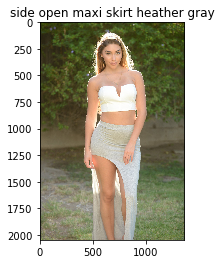

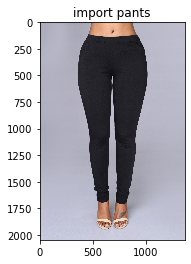

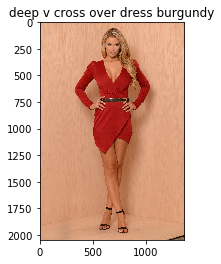

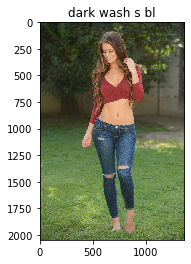

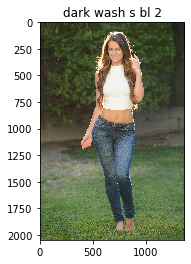

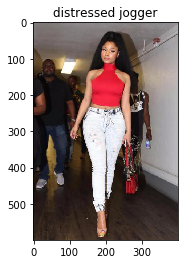

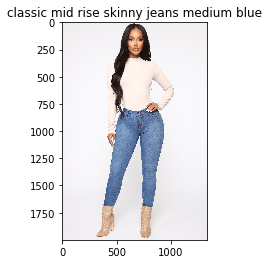

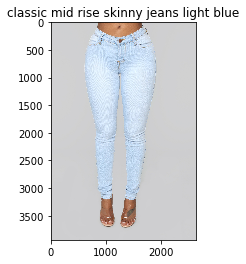

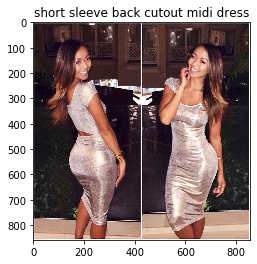

In [144]:
df_test = df[df['cluster'] == 0]
for text in df_test['words'].iloc[50:60,]:
    response = requests.get(vector_images[text])
    img = Image.open(BytesIO(response.content))
    plt.title(text)
    plt.imshow(img)
    plt.show()

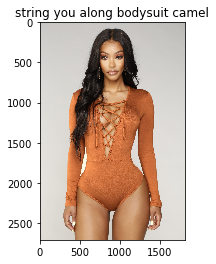

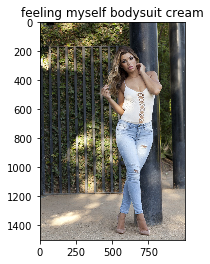

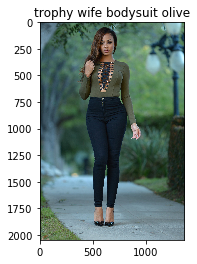

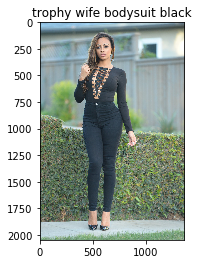

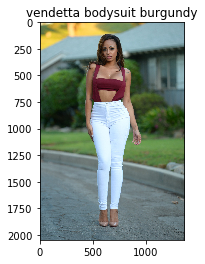

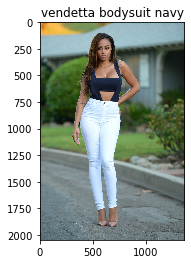

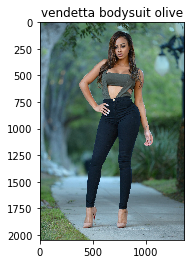

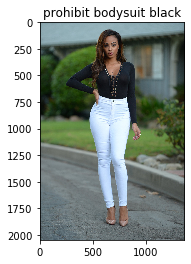

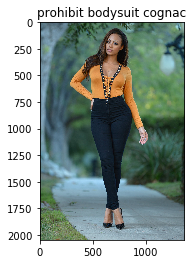

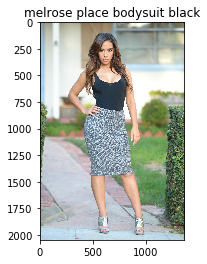

In [145]:
df_test = df[df['cluster'] == 1]
for text in df_test['words'].iloc[50:60,]:
    response = requests.get(vector_images[text])
    img = Image.open(BytesIO(response.content))
    plt.title(text)
    plt.imshow(img)
    plt.show()

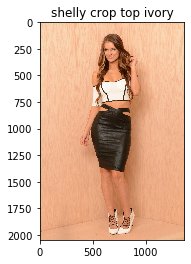

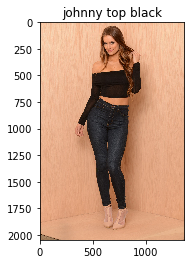

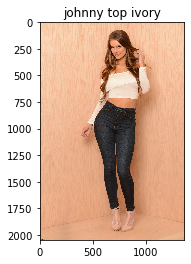

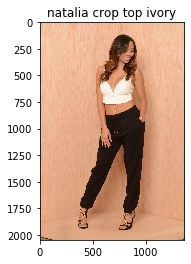

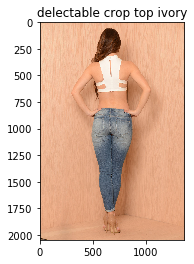

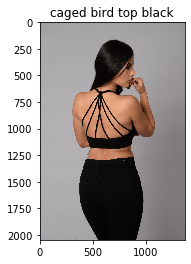

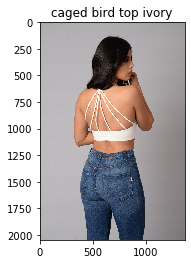

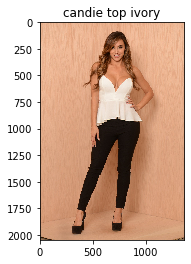

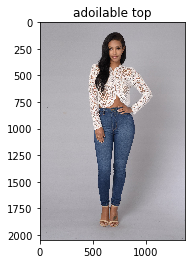

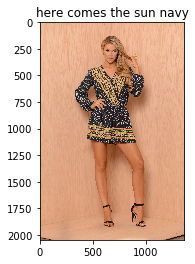

In [146]:
df_test = df[df['cluster'] == 2]
for text in df_test['words'].iloc[50:60,]:
    response = requests.get(vector_images[text])
    img = Image.open(BytesIO(response.content))
    plt.title(text)
    plt.imshow(img)
    plt.show()

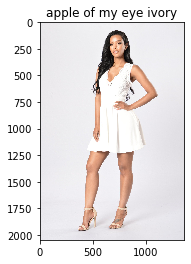

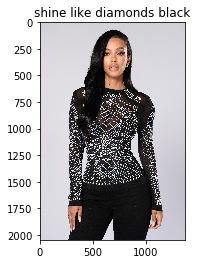

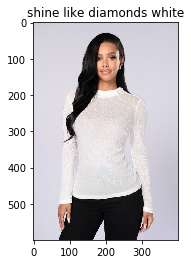

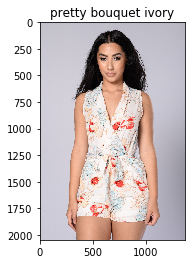

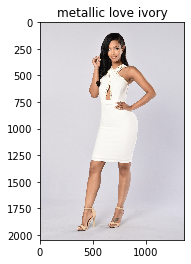

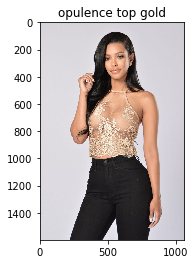

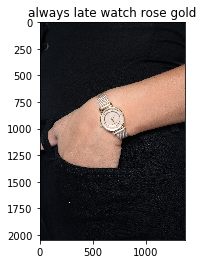

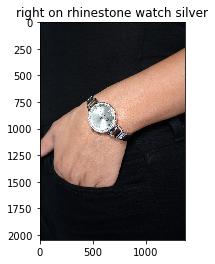

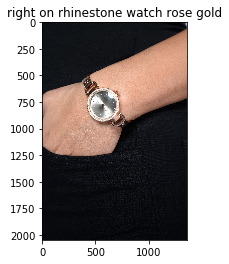

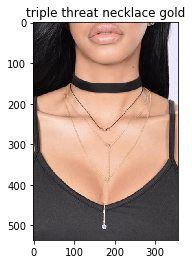

In [147]:
df_test = df[df['cluster'] == 3]
for text in df_test['words'].iloc[50:60,]:
    response = requests.get(vector_images[text])
    img = Image.open(BytesIO(response.content))
    plt.title(text)
    plt.imshow(img)
    plt.show()

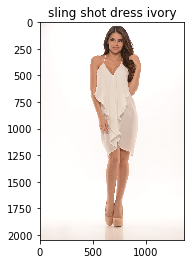

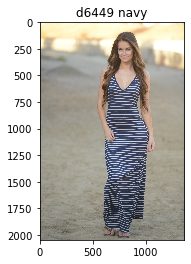

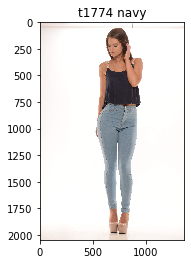

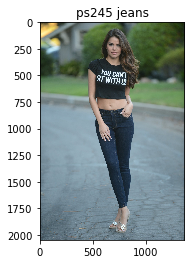

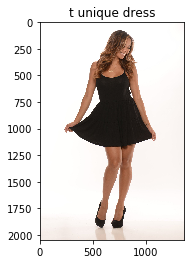

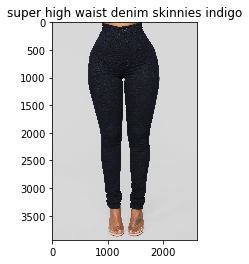

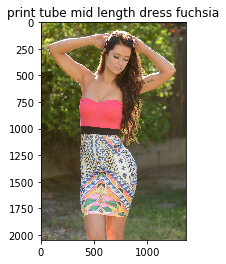

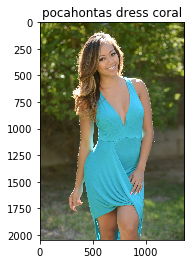

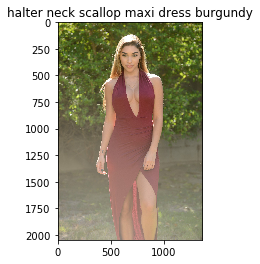

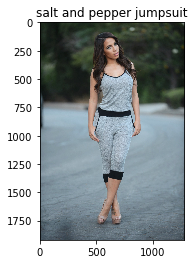

In [148]:
df_test = df[df['cluster'] == 4]
for text in df_test['words'].iloc[50:60,]:
    response = requests.get(vector_images[text])
    img = Image.open(BytesIO(response.content))
    plt.title(text)
    plt.imshow(img)
    plt.show()

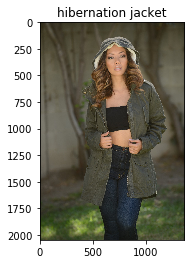

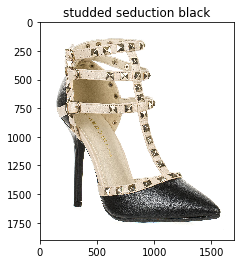

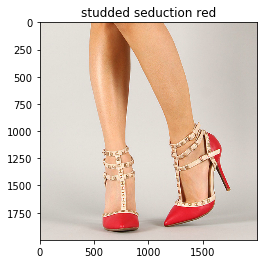

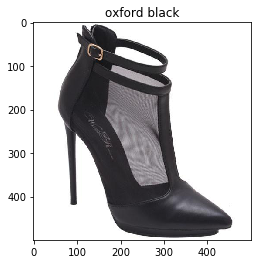

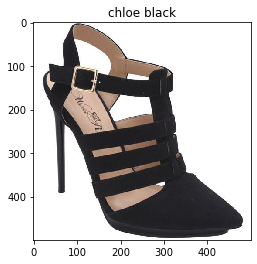

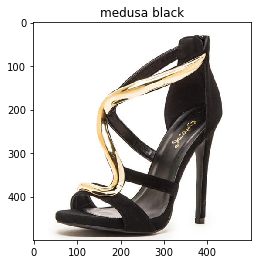

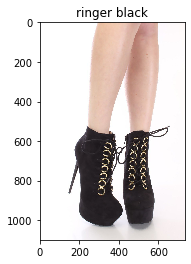

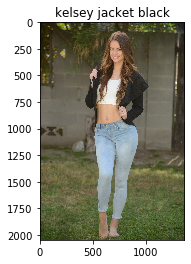

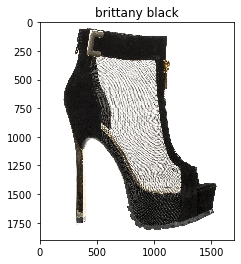

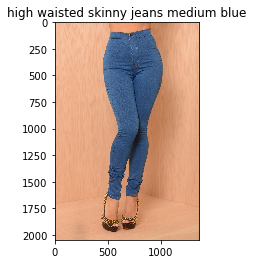

In [149]:
df_test = df[df['cluster'] == 5]
for text in df_test['words'].iloc[50:60,]:
    response = requests.get(vector_images[text])
    img = Image.open(BytesIO(response.content))
    plt.title(text)
    plt.imshow(img)
    plt.show()